This notebook is for...

Using visium data from [Garcia-Alsono et.al](https://www.ebi.ac.uk/arrayexpress/experiments/E-MTAB-9260/files/)
Overview also [here](https://docs.google.com/spreadsheets/d/1c7K7C5ZKNTSnSxgTO7oJte0juwFMqmX3sjeS4wjXy4I/edit#gid=1885672978)

Starting with the sample 152811, A13, early secretory phase.

Following the [scanpy-visium tutorial](https://scanpy-tutorials.readthedocs.io/en/latest/spatial/basic-analysis.html).

In [36]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [2]:
sc.logging.print_versions()
sc.set_figure_params(facecolor="white", figsize=(8, 8))
sc.settings.verbosity = 3

-----
anndata     0.8.0
scanpy      1.9.1
-----
PIL                 9.1.1
asttokens           NA
backcall            0.2.0
beta_ufunc          NA
binom_ufunc         NA
cffi                1.15.0
colorama            0.4.4
cycler              0.10.0
cython_runtime      NA
dateutil            2.8.2
debugpy             1.6.0
decorator           5.1.1
defusedxml          0.7.1
entrypoints         0.4
executing           0.8.3
h5py                3.6.0
hypergeom_ufunc     NA
ipykernel           6.13.0
ipython_genutils    0.2.0
ipywidgets          7.7.0
jedi                0.18.1
joblib              1.1.0
kiwisolver          1.4.2
llvmlite            0.36.0
matplotlib          3.5.2
mpl_toolkits        NA
natsort             8.1.0
nbinom_ufunc        NA
numba               0.53.1
numpy               1.22.4
packaging           21.3
pandas              1.4.2
parso               0.8.3
pexpect             4.8.0
pickleshare         0.7.5
pkg_resources       NA
prompt_toolkit      3.0.29
psutil   

## Reading the data

In [12]:
datadir = "/data/local/rajewsky/home/vschuma/Jackie/data/GarciaAlsono_uterus/visium_data/uterus_152811/152811"
imageloc = "/data/local/rajewsky/home/vschuma/Jackie/data/GarciaAlsono_uterus/visium_data/152811_20x_highest_res_image.jpg"

In [16]:
adata = sc.read_visium(datadir,
                       count_file='152811_manual_filtered_feature_bc_matrix.h5',
                       source_image_path='/data/local/rajewsky/home/vschuma/Jackie/data/GarciaAlsono_uterus/visium_data/')

reading /data/local/rajewsky/home/vschuma/Jackie/data/GarciaAlsono_uterus/visium_data/uterus_152811/152811/152811_manual_filtered_feature_bc_matrix.h5
 (0:00:00)


/data/local/rajewsky/home/vschuma/anaconda3/envs/NovoSpaRc/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [17]:
adata.obs

,in_tissue,array_row,array_col
AAACAAGTATCTCCCA-1,1,50,102
AAACACCAATAACTGC-1,1,59,19
AAACAGCTTTCAGAAG-1,1,43,9
AAACAGGGTCTATATT-1,1,47,13
AAACAGTGTTCCTGGG-1,1,73,43
...,...,...,...
TTGTTGTGTGTCAAGA-1,1,31,77
TTGTTTCACATCCAGG-1,1,58,42
TTGTTTCATTAGTCTA-1,1,60,30
TTGTTTCCATACAACT-1,1,45,27


In [18]:
adata.var_names_make_unique()
adata.var['mt'] = adata.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)

In [19]:
# skipping the QC and preprocessing step bc. I think this stuff should be filtered/preprocessed already

## Manifold embedding and clustering based on transcriptional similarity

In [22]:
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata, key_added="clusters")

computing PCA
    with n_comps=50
    finished (0:00:06)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:11)


ImportError: Please install the leiden algorithm: `conda install -c conda-forge leidenalg` or `pip3 install leidenalg`.

We plot some covariates to check if there is any particular structure in the UMAP associated with total counts and detected genes.

KeyError: 'Could not find key clusters in .var_names or .obs.columns.'

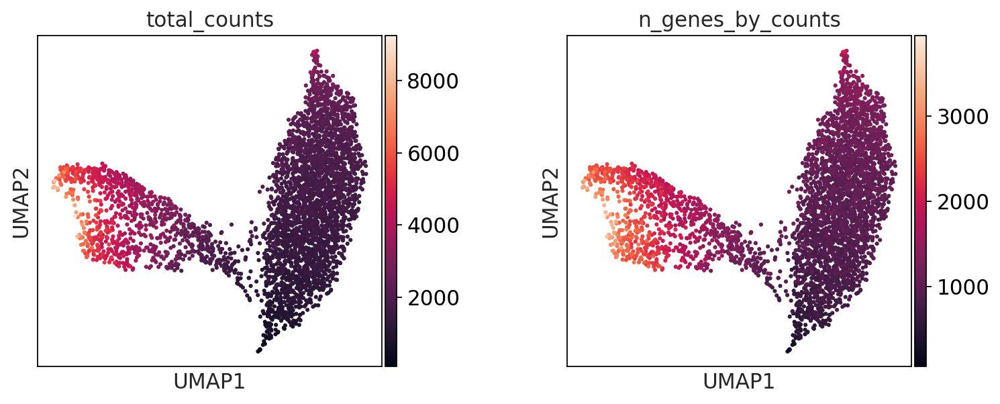

In [69]:
plt.rcParams["figure.figsize"] = (4, 4)
sc.pl.umap(adata, color=["total_counts", "n_genes_by_counts", "clusters"], wspace=0.4)

## Visualization in spatial coordinates

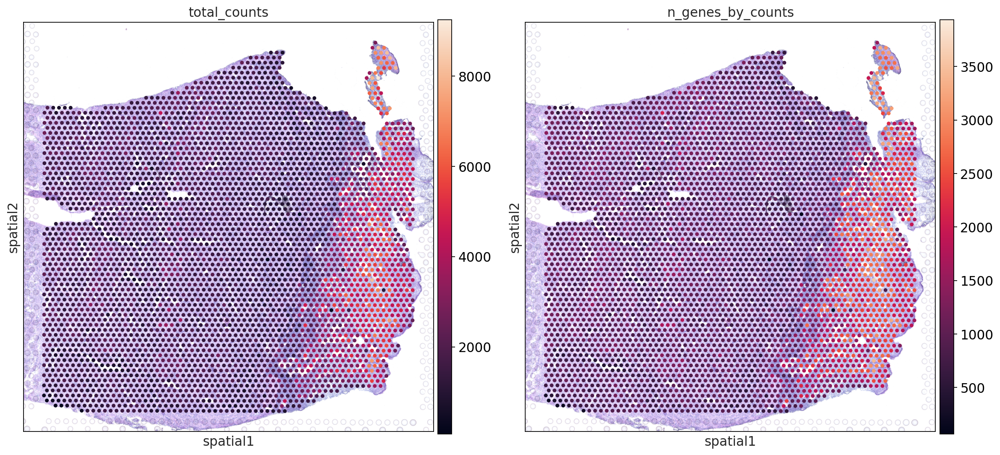

In [70]:
plt.rcParams["figure.figsize"] = (8, 8)
sc.pl.spatial(adata, img_key="hires", color=["total_counts", "n_genes_by_counts"])

 ## Cluster/show marker genes

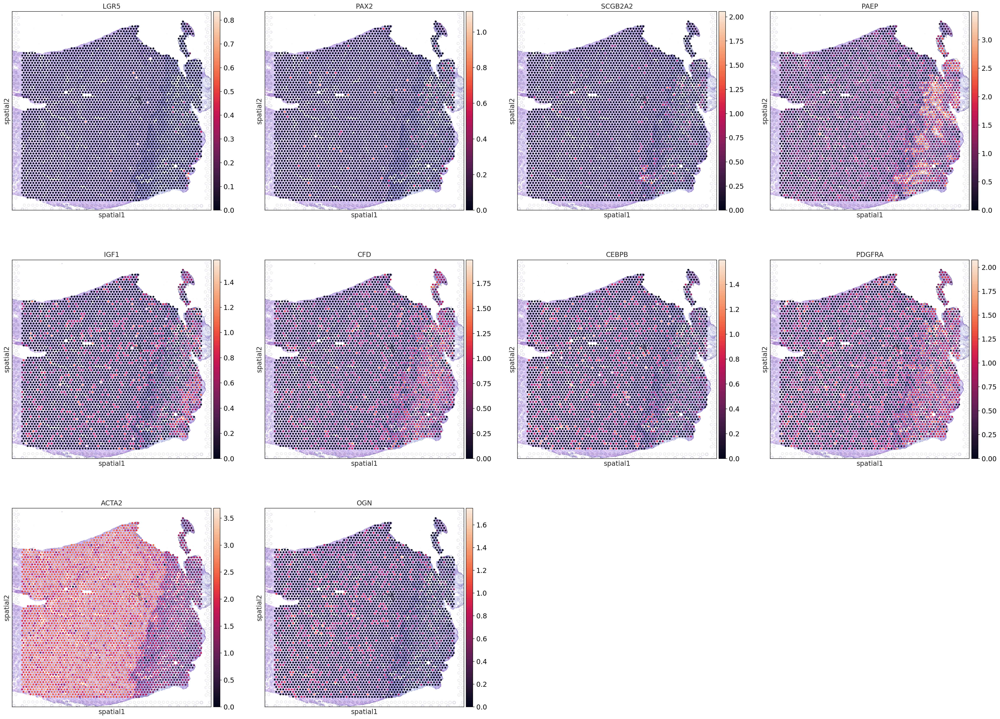

In [71]:
marker_genes = ['LGR5', # epithel
            'PAX2',# lumenal
            'SCGB2A2','PAEP', # glandular
            'IGF1', # stroma
            'CFD','CEBPB', 'PDGFRA', # secretory stroma
            'ACTA2', 'OGN' # fibroblasts
             ] # add marker genes from other notebook here
# make a loop to show the image for all the marker genes
sc.pl.spatial(adata, img_key="hires", color=marker_genes)

## Extract locations.txt and dge.txt from the anndata object

In [59]:
# normalize expression data
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [60]:
adata

AnnData object with n_obs × n_vars = 3871 × 33538
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'spatial', 'pca', 'neighbors', 'umap', 'log1p', 'hvg'
    obsm: 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [62]:
adata.obsm['spatial'] # probably coordinates according to https://github.com/scverse/squidpy_notebooks/blob/main/docs/source/auto_tutorials/tutorial_read_spatial.rst

array([[ 6803,  8816],
       [ 2258,  9665],
       [ 1714,  8140],
       ...,
       [ 2860,  9762],
       [ 2699,  8333],
       [ 3460, 11001]])

In [68]:
coord = adata.obsm['spatial']
pd.DataFrame(data=coord, columns=['x','y']).to_csv('endometr_coordinates.csv')

In [63]:
t=adata.X.toarray()
pd.DataFrame(data=t, index=adata.obs_names, columns=adata.var_names).to_csv('adata_raw_x.csv')

In [58]:
adata.X

<3871x33538 sparse matrix of type '<class 'numpy.float32'>'
	with 4665604 stored elements in Compressed Sparse Row format>

In [39]:
np.savetxt('endometrium_dge.txt', adata.X)

ValueError: Expected 1D or 2D array, got 0D array instead

In [45]:
adata.var

,gene_ids,feature_types,genome,mt,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts
MIR1302-2HG,ENSG00000243485,Gene Expression,GRCh38,False,0,0.000000,0.000000,100.000000,0.0,0.000000
FAM138A,ENSG00000237613,Gene Expression,GRCh38,False,0,0.000000,0.000000,100.000000,0.0,0.000000
OR4F5,ENSG00000186092,Gene Expression,GRCh38,False,0,0.000000,0.000000,100.000000,0.0,0.000000
AL627309.1,ENSG00000238009,Gene Expression,GRCh38,False,2,0.000517,0.000517,99.948334,2.0,1.098612
AL627309.3,ENSG00000239945,Gene Expression,GRCh38,False,0,0.000000,0.000000,100.000000,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...
AC233755.2,ENSG00000277856,Gene Expression,GRCh38,False,0,0.000000,0.000000,100.000000,0.0,0.000000
AC233755.1,ENSG00000275063,Gene Expression,GRCh38,False,0,0.000000,0.000000,100.000000,0.0,0.000000
AC240274.1,ENSG00000271254,Gene Expression,GRCh38,False,4,0.001033,0.001033,99.896668,4.0,1.609438
AC213203.1,ENSG00000277475,Gene Expression,GRCh38,False,0,0.000000,0.000000,100.000000,0.0,0.000000


In [49]:
print(adata.X)

  (0, 33508)	10.0
  (0, 33506)	1.0
  (0, 33505)	15.0
  (0, 33503)	13.0
  (0, 33502)	13.0
  (0, 33501)	14.0
  (0, 33499)	14.0
  (0, 33498)	11.0
  (0, 33497)	4.0
  (0, 33496)	5.0
  (0, 33484)	1.0
  (0, 33479)	3.0
  (0, 33474)	3.0
  (0, 33445)	1.0
  (0, 33412)	1.0
  (0, 33297)	1.0
  (0, 33258)	1.0
  (0, 33254)	1.0
  (0, 33245)	1.0
  (0, 33244)	2.0
  (0, 33243)	1.0
  (0, 33207)	5.0
  (0, 33161)	1.0
  (0, 33155)	1.0
  (0, 33141)	3.0
  :	:
  (3870, 733)	1.0
  (3870, 712)	1.0
  (3870, 701)	1.0
  (3870, 656)	2.0
  (3870, 609)	1.0
  (3870, 577)	1.0
  (3870, 533)	1.0
  (3870, 493)	2.0
  (3870, 412)	1.0
  (3870, 405)	1.0
  (3870, 350)	1.0
  (3870, 237)	1.0
  (3870, 234)	1.0
  (3870, 224)	1.0
  (3870, 219)	1.0
  (3870, 210)	1.0
  (3870, 201)	1.0
  (3870, 157)	1.0
  (3870, 154)	1.0
  (3870, 102)	1.0
  (3870, 89)	1.0
  (3870, 78)	1.0
  (3870, 77)	1.0
  (3870, 53)	1.0
  (3870, 51)	2.0
